In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [2]:
import os
folder_path = '/content/drive/MyDrive/Colab Notebooks/Detectron2'

In [3]:
!python -m pip install pyyaml

In [4]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-2pqkrq93
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-2pqkrq93
  Resolved https://github.com/facebookresearch/detectron2.git to commit 5b72c27ae39f99db75d43f18fd1312e1ea934e60
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 4.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.2/78.2 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 12.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 13.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 60.1 MB/s eta 0:00:00
  Created wheel for detectron2: filename=detectron2-0.6-cp3

In [5]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

<Logger detectron2 (DEBUG)>

In [6]:
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

In [7]:
import numpy as np
import torch, os, json, cv2, random
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

Balloon Dataset

In [8]:
# https://github.com/matterport/Mask_RCNN/releases/download/v2.1/balloon_dataset.zip

balloon_path = '/content/drive/MyDrive/Colab Notebooks/Detectron2/balloon/'

In [9]:
# function to parse and prepare bolloon dataset into detectron2's standard format

from detectron2.structures import BoxMode

def get_balloon_dicts(balloon_path):
    json_file = os.path.join(balloon_path, "via_region_data.json")
    with open(json_file) as f:
        imgs_anns = json.load(f)

    dataset_dicts = []
    for idx, v in enumerate(imgs_anns.values()):
        record = {}

        filename = os.path.join(balloon_path, v["filename"])
        height, width = cv2.imread(filename).shape[:2]

        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width

        annos = v["regions"]
        objs = []
        for _, anno in annos.items():
            assert not anno["region_attributes"]
            anno = anno["shape_attributes"]
            px = anno["all_points_x"]
            py = anno["all_points_y"]
            poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            poly = [p for x in poly for p in x]

            obj = {
                "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [poly],
                "category_id": 0,
            }
            objs.append(obj)

        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

In [10]:
from detectron2.data import DatasetCatalog, MetadataCatalog

for d in ["train", "val"]:
    dataset_name = "balloon_" + d

    # Unregister the dataset if it already exists
    if dataset_name in DatasetCatalog.list():
        DatasetCatalog.remove(dataset_name)
        MetadataCatalog.remove(dataset_name)

    # Register the dataset
    DatasetCatalog.register(dataset_name, lambda d=d: get_balloon_dicts(balloon_path + d + '/'))
    MetadataCatalog.get(dataset_name).set(thing_classes=["balloon"])

balloon_metadata = MetadataCatalog.get("balloon_train")


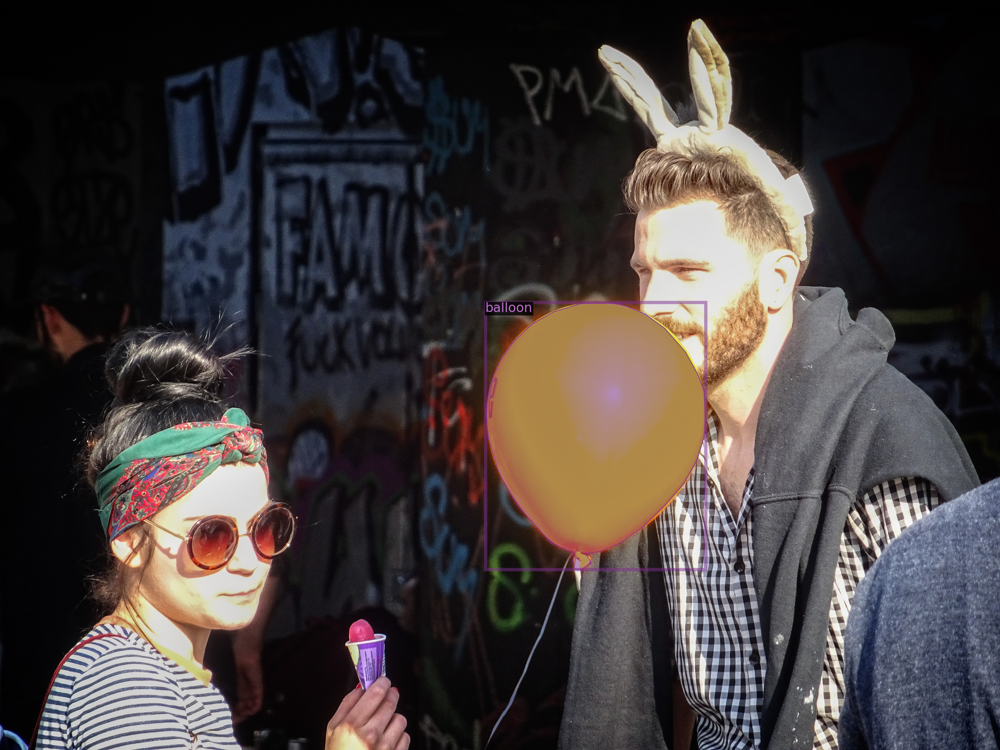

In [13]:
dataset_dicts = get_balloon_dicts(balloon_path + "train/")

d = dataset_dicts[0]

img = cv2.imread(d["file_name"])
visualizer = Visualizer(img[:, :, ::-1], metadata=balloon_metadata, scale=1.0)  # scale=1.0 for original size
out = visualizer.draw_dataset_dict(d)
cv2_imshow(out.get_image()[:, :, ::-1])

In [15]:
#https://github.com/facebookresearch/detectron2/tree/main/configs/COCO-Detection

from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("balloon_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 500
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[08/25 11:46:26 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f6e8b1.pkl: 243MB [00:01, 224MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[08/25 11:46:28 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3587.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[08/25 11:46:45 d2.utils.events]:  eta: 0:05:01  iter: 19  total_loss: 1.468  loss_cls: 0.7446  loss_box_reg: 0.5944  loss_rpn_cls: 0.06282  loss_rpn_loc: 0.009183    time: 0.6296  last_time: 0.6629  data_time: 0.0251  last_data_time: 0.0032   lr: 9.7405e-06  max_mem: 3331M
[08/25 11:47:01 d2.utils.events]:  eta: 0:04:42  iter: 39  total_loss: 1.427  loss_cls: 0.6855  loss_box_reg: 0.6836  loss_rpn_cls: 0.04448  loss_rpn_loc: 0.007693    time: 0.6147  last_time: 0.5396  data_time: 0.0101  last_data_time: 0.0059   lr: 1.9731e-05  max_mem: 3469M
[08/25 11:47:12 d2.utils.events]:  eta: 0:04:25  iter: 59  total_loss: 1.224  loss_cls: 0.572  loss_box_reg: 0.6288  loss_rpn_cls: 0.01701  loss_rpn_loc: 0.004398    time: 0.6002  last_time: 0.6091  data_time: 0.0106  last_data_time: 0.0072   lr: 2.972e-05  max_mem: 3469M
[08/25 11:47:24 d2.utils.events]:  eta: 0:04:13  iter: 79  total_loss: 1.134  loss_cls: 0.4568  loss_box_reg: 0.6355  loss_rpn_cls: 0.01483  loss_rpn_loc: 0.004114    time: 0.60

In [16]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

Inference & Evaluation using the Trained Model

In [17]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
cfg.DATASETS.TEST = ("balloon_val", )
predictor = DefaultPredictor(cfg)

[08/25 11:55:36 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


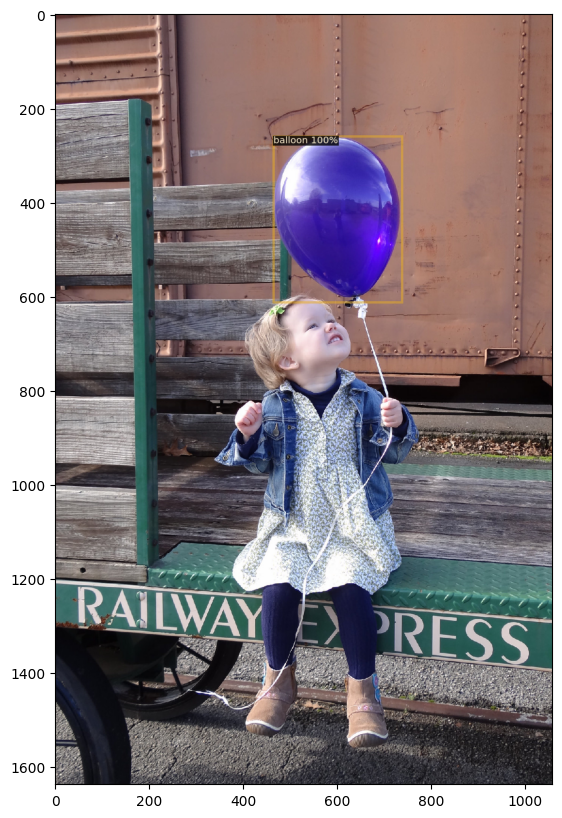

In [20]:
dataset_dicts = get_balloon_dicts(balloon_path + "val")

d = dataset_dicts[0]

im = cv2.imread(d["file_name"])
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], metadata=balloon_metadata, scale=0.8)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.figure(figsize = (14, 10))
plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
plt.show()

Evaluating the performance of Trained Faster RCNN using Average Precision (AP) metric implemented in COCO API.

In [21]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("balloon_val", ("bbox",), False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "balloon_val")

print(inference_on_dataset(trainer.model, val_loader, evaluator))

[08/25 11:59:31 d2.evaluation.coco_evaluation]: Trying to convert 'balloon_val' to COCO format ...
[08/25 11:59:31 d2.data.datasets.coco]: Converting annotations of dataset 'balloon_val' to COCO format ...)
[08/25 11:59:31 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[08/25 11:59:31 d2.data.datasets.coco]: Conversion finished, #images: 13, #annotations: 50
[08/25 11:59:31 d2.data.datasets.coco]: Caching COCO format annotations at './output/balloon_val_coco_format.json' ...
[08/25 11:59:32 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|  balloon   | 50           |
|            |              |
[08/25 11:59:32 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[08/25 11:59:32 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[0

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[08/25 11:59:34 d2.evaluation.evaluator]: Inference done 11/13. Dataloading: 0.0015 s/iter. Inference: 0.1492 s/iter. Eval: 0.0003 s/iter. Total: 0.1510 s/iter. ETA=0:00:00


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[08/25 11:59:35 d2.evaluation.evaluator]: Total inference time: 0:00:01.290737 (0.161342 s / iter per device, on 1 devices)
[08/25 11:59:35 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:01 (0.145394 s / iter per device, on 1 devices)
[08/25 11:59:35 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[08/25 11:59:35 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[08/25 11:59:35 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[08/25 11:59:35 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[08/25 11:59:35 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[08/25 11:59:35 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[08/25 11:59:35 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.00 seconds.
 Average Precision  (AP)